In [1]:
# procedure for calculating surface settlements along a tunnel
# completed procedure will in the form of a design report
#   forecast settlements

# project name: 'Test'

In [2]:
# import libraries
from numpy import *
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# set maximum number of rows to display from a pandas data frame
#pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_rows', 30000)

In [4]:
# set up plotly in 'offline' mode                            #ToDo JK: this should be cleaned up and documented
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
print (__version__) # requires version >= 1.9.0

# collect all plotly setups here
import plotly.offline as plotly  #testing
from plotly.graph_objs import *  #testing

2.2.1


In [5]:
# set wd for this procedure and project 
import sys, os
os.chdir("/home/kaelin_joseph/TunnelGIS")

In [6]:
# define required input files
# import cataFrame with calculated results from Tunnel GIS
align_data_df = pd.read_csv('data/in/Ostroehre.TunnelExcavationData.R3.csv',index_col=0)

In [7]:
# define required input data
# basic tunnel data                                             #ToDo: revise figure to correspond to input naming
D = 13.0            #tunnel diameter (m)
A = pi*(D/2.0)**2   #tunnel excavation cross-section (m2)
d = 2*D             #distance between ground surface and tunnel centerline (m)
d_rock = -(D/2)     #rock cover above tunnel crown (m)
gamma = 20.0        #ground ensity (kN/m3)
p_supp = 0.4 * d * gamma  #face support pressure

In [8]:
# define temporary data


In [9]:
# define output files
# create dataframe for results of settlement calculations
settlements_df = pd.DataFrame()

In [10]:
align_data_df

,Station,Easting,Northing,Elevation,DTM,RockSurface,StationReal,RockCover,WBScode,WorkType,...,ProfileType,SectionArea,Description,Unit,BoreClass,SupportClass,DisposalClass,StationInterval,ExcavationVolume,DisposalVolume
0,204+874.1,2612071.548,1269294.122,270.962,253.524,236.000,204874.100,-34.962,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,0.899819,NaN,NaN
1,204+875,2612072.229,1269294.710,270.975,253.524,236.000,204875.000,-34.975,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000272,NaN,NaN
2,204+880,2612076.083,1269297.895,271.047,253.160,236.000,204880.000,-35.047,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000597,NaN,NaN
3,204+885,2612080.052,1269300.936,271.120,252.934,235.815,204885.000,-35.305,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000709,NaN,NaN
4,204+890,2612084.131,1269303.828,271.192,252.934,235.815,204890.000,-35.377,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999657,NaN,NaN
5,204+895,2612088.313,1269306.567,271.265,252.574,235.815,204895.000,-35.450,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000403,NaN,NaN
6,204+900,2612092.594,1269309.150,271.337,252.013,235.707,204900.000,-35.630,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.000813,NaN,NaN
7,204+905,2612096.968,1269311.573,271.410,251.805,235.707,204905.000,-35.703,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999546,NaN,NaN
8,204+910,2612101.427,1269313.833,271.482,251.631,235.707,204910.000,-35.775,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,5.001084,NaN,NaN
9,204+915,2612105.968,1269315.927,271.555,251.149,235.707,204915.000,-35.848,1,NaN,...,NaN,NaN,highway,m3,NaN,NaN,NaN,4.999596,NaN,NaN


In [11]:
#len(align_data_df.index)
len(align_data_df)  #includes header and 1 blank line ??
#align_data_df.count()

922

In [26]:
# calculate settlements at stationed points along tunnel alignment
for i in range(len(align_data_df.index) - 3): #start loop over rows (=points) in align_data_df
    # read values which are needed for calculation of point i into a numpy array
    pt_a = array( [align_data_df['Easting'][i], align_data_df['Northing'][i], align_data_df['Elevation'][i], 
                   align_data_df['DTM'][i], align_data_df['RockCover'][i]] )
    pt_a = asfarray(pt_a,float)  #return an array converted to a float type
    stat = align_data_df['Station'][i]
    # read in the values which are needed for calculation of point i+1
    pt_b = array( [align_data_df['Easting'][i+1], align_data_df['Northing'][i+1], align_data_df['Elevation'][i+1],
                   align_data_df['DTM'][i+1], align_data_df['RockCover'][i+1]] )
    pt_b=asfarray(pt_b,float)
    d = pt_a[3] - pt_a[2]  #total overburden in m
    if d < 4: #if the overburden is < 4, stop calculation (assumed to be cut & cover section)                                          #ToDo JK -rework 
        continue  #return (to for loop without executing statement below)                      #ToDo JK -rework 
  
    # define normal vector (=cross-section) to alignment at point a                #ToDo JK -make into function
    v_ab = array([pt_b[0] - pt_a[0], pt_b[1] - pt_a[1]])  #vector between point i and i+1
    nv_ab = array([-v_ab[1], v_ab[0]])  #normal vector to alginment at point a
    norm = (nv_ab[0]**2 + nv_ab[1]**2)**0.5  #magnitude of normal vector
    nnv_ab = nv_ab / norm  #unit normal vector
    #res = 2.0  #resolution for point along cross-section                                #ToDo JK -mv to inputs
    res = 5.0
    l_range, r_range = 40.0, 40.0                                                        #ToDo JK -mv to inputs
    xs_pts = arange(-l_range, r_range+res, res)
    X_i = pt_a[0] + nnv_ab[0]*xs_pts  #list of x-coords along cross-section
    Y_i = pt_a[1] + nnv_ab[1]*xs_pts  #list of x-coords along cross-section
    #print('i= ', i)  #testing
    #print('v_ab: ', v_ab)  #testing
    #print('nv_ab: ', nv_ab)  #testing
    #print('X_i: ', X_i)  #testing
    #print('Y_i: ', Y_i)  #testing
    
    '''Calculate Greenfield-Settlements with Gauss Kurve'''
    #Input Paraneter
#     D_t=13.0    #Tunneldiameter in [m]                                                       #mv to input above
#     K_g=0.5   #K_g [0.4-0.6] nach Fillibeck für nichtbindigen Boden, dicht gelagert
#     K_t=0.7   #K_t [0.5-0.9] nach Fillibeck für bindigen Boden, dicht gelagert
    
#     if pt_a[4] < 0.0 :                                                                          #a[4]: rockcover
#         i_0=K_g*d   #Wendepunktabstand für Tunnel im Lockergestein                              #d : total cover
#     else:                                                                                    #elif a[4] > 0.0 :
#         i_0=K_t * pt_a[4] + K_g*(d-pt_a[4])   #Wendepunktabstand für Tunnel im Fels

#     A_t = ((D_t**2.0) * pi) / 4.0
#     V_l= 0.0064*(A_t/d)**(-0.75)  #nach Fillibeck,90%-Wahrscheinlichkeit, gilt für h/d>0.3

#     # calculate Settlement trough with gaussian curve
#     #print('i = ', i)
#     S= -((pi/2)**(0.5)) * (V_l*(D_t**2))/(4*i_0) *exp(-(xs_pts**2)/(2*i_0**2))
#     beta=zeros((len(S)))    #creates vector for tangentenneigung  #numpy: return a new array filled with zeros
#     beta[1:]=abs((diff(S)/res))  #tangentenneigung der setzungen  #python array slice notation: start at index 1
    
    
    # empirical estimates of calculation coefficients (coeff's must have save number of items)
    # coeff's for calculation results 0
    # these coeff's are for bored tunnels in soil
    c_v = array([0.004]) #empirical values for lost ground as fraction of excavation area
    c_i = array([0.5]) #empirical coeff's to estimate distance centerline to inflection point of gauss curve
    
    # calculate intermediate results (d assumed constant along cross-section)
    vol_loss = A * c_v
    infl_len = d * c_i
    # calculte settlement at centerline
    setl_max = vol_loss / (sqrt(2*pi) * infl_len)
    # calculate settlment at distance x along gauss curve                          #ToDo: lambda or function preferred?
    setl = lambda x: (
        setl_max * exp(- x**2 / (2 * infl_len**2)) )

    # calculate settlment at distance x along cross-section
    ####x = arange(-30,31,1)
    ####setl_rslts = []

    ####for i in x:
    ####    setl_rslts.append(setl(i, setl_max, infl_len))    
    
    S = -setl(xs_pts)
    #print(S)    

    beta=zeros((len(S)))    #creates vector for tangentenneigung  #numpy: return a new array filled with zeros
    beta[1:]=abs((diff(S)/res))  #tangentenneigung der setzungen  #python array slice notation: start at index 1
    
    
    
    '''data frame'''
    #create dataframe including the calculated settlements etc. 
    calc_results = {'station':stat,
                    'x_station':pt_a[0],
                    'y_station':pt_a[1],
                    'x-sect_x': X_i,
                    'x-sect_y': Y_i,
                    'settlement [mm]': S*1000,
                    'diff_settle': beta,
                    'depth': d}
    
    calc_results_df = pd.DataFrame(calc_results)

    #append the calculated values to the dataframe
    settlements_df=settlements_df.append(calc_results_df)
    
    stat_monitor = '208+374'
    if stat == stat_monitor:
        S_stat_monitor = S
        print(beta[0])
        print(S)
        print(beta[1:])
    
#when loop is finished, safe dataframe to .csv
settlements_df.to_csv('data/out/Settlement.csv')
print('run complete')

[-6.17492624e-86 -3.39998251e-66 -4.36725889e-49 -1.30866515e-34
 -9.14819648e-23 -1.49186586e-13 -5.67559517e-07 -5.03709791e-03
 -1.04288572e-01 -5.03709791e-03 -5.67559517e-07 -1.49186586e-13
 -9.14819648e-23 -1.30866515e-34 -4.36725889e-49 -3.39998251e-66
 -6.17492624e-86]
[-5.51693664e-74 -4.71737437e-57 -2.22896053e-42 -5.81974692e-30
 -8.39663950e-20 -6.69432207e-12 -2.94922146e-06 -7.17972574e-03
 -9.65846280e-02 -7.17972574e-03 -2.94922146e-06 -6.69432207e-12
 -8.39663950e-20 -5.81974692e-30 -2.22896053e-42 -4.71737437e-57
 -5.51693664e-74]
[-2.25177479e-81 -1.05035101e-62 -1.58843467e-46 -7.78806665e-33
 -1.23798494e-21 -6.38008496e-13 -1.06601413e-06 -5.77463932e-03
 -1.01417328e-01 -5.77463932e-03 -1.06601413e-06 -6.38008496e-13
 -1.23798494e-21 -7.78806665e-33 -1.58843467e-46 -1.05035101e-62
 -2.25177479e-81]
[-1.33639685e-60 -8.13843045e-47 -7.19777899e-35 -9.24504430e-25
 -1.72453544e-16 -4.67183924e-10 -1.83804565e-05 -1.05021287e-02
 -8.71467143e-02 -1.05021287e-02 -1.

[-3.03901255e-07 -4.32069229e-06 -4.31186084e-05 -3.02041549e-04
 -1.48511196e-03 -5.12557102e-03 -1.24169768e-02 -2.11144629e-02
 -2.52019857e-02 -2.11144629e-02 -1.24169768e-02 -5.12557102e-03
 -1.48511196e-03 -3.02041549e-04 -4.31186084e-05 -4.32069229e-06
 -3.03901255e-07]
[-5.54537576e-07 -6.80174589e-06 -5.97243232e-05 -3.75425252e-04
 -1.68941807e-03 -5.44242182e-03 -1.25512989e-02 -2.07217561e-02
 -2.44909625e-02 -2.07217561e-02 -1.25512989e-02 -5.44242182e-03
 -1.68941807e-03 -3.75425252e-04 -5.97243232e-05 -6.80174589e-06
 -5.54537576e-07]
[-4.89398440e-07 -6.19000411e-06 -5.58190164e-05 -3.58869300e-04
 -1.64495235e-03 -5.37567769e-03 -1.25249502e-02 -2.08056687e-02
 -2.46405409e-02 -2.08056687e-02 -1.25249502e-02 -5.37567769e-03
 -1.64495235e-03 -3.58869300e-04 -5.58190164e-05 -6.19000411e-06
 -4.89398440e-07]
[-1.15328244e-06 -1.18111571e-05 -8.87023206e-05 -4.88498551e-04
 -1.97277403e-03 -5.84221005e-03 -1.26871115e-02 -2.02038489e-02
 -2.35934380e-02 -2.02038489e-02 -1.

 -0.00523765 -0.002826   -0.00132942 -0.00054526 -0.00019498]
[-0.00021213 -0.00058011 -0.00138728 -0.00290112 -0.00530532 -0.00848406
 -0.01186426 -0.01450851 -0.01551495 -0.01450851 -0.01186426 -0.00848406
 -0.00530532 -0.00290112 -0.00138728 -0.00058011 -0.00021213]
[-0.00022386 -0.00060349 -0.00142545 -0.00294986 -0.00534841 -0.00849612
 -0.01182467 -0.01441884 -0.01540437 -0.01441884 -0.01182467 -0.00849612
 -0.00534841 -0.00294986 -0.00142545 -0.00060349 -0.00022386]
[-0.00025303 -0.00066025 -0.00151602 -0.00306309 -0.005446   -0.00852038
 -0.01173012 -0.01421048 -0.01514877 -0.01421048 -0.01173012 -0.00852038
 -0.005446   -0.00306309 -0.00151602 -0.00066025 -0.00025303]
[-0.00025258 -0.00065938 -0.00151465 -0.0030614  -0.00544458 -0.00852006
 -0.01173156 -0.01421358 -0.01515256 -0.01421358 -0.01173156 -0.00852006
 -0.00544458 -0.0030614  -0.00151465 -0.00065938 -0.00025258]
[-0.00027186 -0.0006959  -0.0015715  -0.00313083 -0.00550273 -0.00853239
 -0.01167176 -0.01408561 -0.01499

[-0.00131233 -0.00215512 -0.00331266 -0.00476604 -0.00641823 -0.00809
 -0.00954461 -0.01054008 -0.01089446 -0.01054008 -0.00954461 -0.00809
 -0.00641823 -0.00476604 -0.00331266 -0.00215512 -0.00131233]
[-0.00133979 -0.00218625 -0.00334201 -0.00478587 -0.00642036 -0.00806867
 -0.00949926 -0.01047666 -0.01082431 -0.01047666 -0.00949926 -0.00806867
 -0.00642036 -0.00478587 -0.00334201 -0.00218625 -0.00133979]
[-0.00134632 -0.00219361 -0.00334892 -0.00479049 -0.00642078 -0.00806357
 -0.00948851 -0.01046166 -0.01080774 -0.01046166 -0.00948851 -0.00806357
 -0.00642078 -0.00479049 -0.00334892 -0.00219361 -0.00134632]
[-0.00137389 -0.00222456 -0.00337777 -0.00480962 -0.00642222 -0.00804183
 -0.00944319 -0.01039865 -0.01073815 -0.01039865 -0.00944319 -0.00804183
 -0.00642222 -0.00480962 -0.00337777 -0.00222456 -0.00137389]
[-0.0013964  -0.00224964 -0.00340096 -0.00482476 -0.00642299 -0.00802389
 -0.0094063  -0.01034759 -0.01068183 -0.01034759 -0.0094063  -0.00802389
 -0.00642299 -0.00482476 -0.

 -0.00628591 -0.00511364 -0.00397349 -0.00294913 -0.00209073]
[-0.00209255 -0.00295079 -0.00397465 -0.00511397 -0.00628515 -0.00737857
 -0.0082742  -0.00886296 -0.00906838 -0.00886296 -0.0082742  -0.00737857
 -0.00628515 -0.00511397 -0.00397465 -0.00295079 -0.00209255]
[-0.00202258 -0.00288653 -0.0039287  -0.00509948 -0.00631259 -0.00745235
 -0.00839041 -0.009009   -0.00922518 -0.009009   -0.00839041 -0.00745235
 -0.00631259 -0.00509948 -0.0039287  -0.00288653 -0.00202258]
[-0.00204682 -0.00290895 -0.00394491 -0.00510487 -0.00630344 -0.00742706
 -0.00835029 -0.00895845 -0.00917086 -0.00895845 -0.00835029 -0.00742706
 -0.00630344 -0.00510487 -0.00394491 -0.00290895 -0.00204682]
[-0.00205116 -0.00291294 -0.00394778 -0.00510579 -0.00630176 -0.0074225
 -0.0083431  -0.0089494  -0.00916114 -0.0089494  -0.0083431  -0.0074225
 -0.00630176 -0.00510579 -0.00394778 -0.00291294 -0.00205116]
[-0.0020755  -0.00293526 -0.00396369 -0.00511074 -0.00629213 -0.00739676
 -0.00830264 -0.00889858 -0.0091065

[-0.00243766 -0.00324683 -0.00416244 -0.00513615 -0.00609999 -0.00697304
 -0.00767216 -0.00812484 -0.0082816  -0.00812484 -0.00767216 -0.00697304
 -0.00609999 -0.00513615 -0.00416244 -0.00324683 -0.00243766]
[-0.00244748 -0.00325471 -0.00416676 -0.00513547 -0.00609335 -0.00696027
 -0.00765403 -0.00810305 -0.00825851 -0.00810305 -0.00765403 -0.00696027
 -0.00609335 -0.00513547 -0.00416676 -0.00325471 -0.00244748]
[-0.0024547  -0.00326048 -0.00416991 -0.00513492 -0.0060884  -0.00695081
 -0.00764064 -0.00808698 -0.00824148 -0.00808698 -0.00764064 -0.00695081
 -0.0060884  -0.00513492 -0.00416991 -0.00326048 -0.0024547 ]
[-0.00246019 -0.00326485 -0.00417227 -0.00513447 -0.00608461 -0.00694359
 -0.00763043 -0.00807473 -0.00822851 -0.00807473 -0.00763043 -0.00694359
 -0.00608461 -0.00513447 -0.00417227 -0.00326485 -0.00246019]
[-0.00247163 -0.00327394 -0.00417714 -0.00513346 -0.00607663 -0.00692846
 -0.00760909 -0.00804916 -0.00820143 -0.00804916 -0.00760909 -0.00692846
 -0.00607663 -0.005133

[-0.00263942 -0.00340163 -0.00423813 -0.00510471 -0.00594399 -0.00669105
 -0.00728149 -0.00766048 -0.00779115 -0.00766048 -0.00728149 -0.00669105
 -0.00594399 -0.00510471 -0.00423813 -0.00340163 -0.00263942]
[-0.00263749 -0.00340022 -0.00423755 -0.0051052  -0.0059457  -0.00669396
 -0.00728543 -0.00766511 -0.00779602 -0.00766511 -0.00728543 -0.00669396
 -0.0059457  -0.0051052  -0.00423755 -0.00340022 -0.00263749]
[-0.00263812 -0.00340068 -0.00423774 -0.00510505 -0.00594514 -0.00669302
 -0.00728416 -0.00766361 -0.00779444 -0.00766361 -0.00728416 -0.00669302
 -0.00594514 -0.00510505 -0.00423774 -0.00340068 -0.00263812]
[-0.00263851 -0.00340097 -0.00423786 -0.00510494 -0.00594479 -0.00669242
 -0.00728335 -0.00766266 -0.00779344 -0.00766266 -0.00728335 -0.00669242
 -0.00594479 -0.00510494 -0.00423786 -0.00340097 -0.00263851]
[-0.00264032 -0.00340228 -0.0042384  -0.00510448 -0.00594319 -0.00668968
 -0.00727964 -0.00765831 -0.00778885 -0.00765831 -0.00727964 -0.00668968
 -0.00594319 -0.005104

[-0.00239675 -0.00321366 -0.00414375 -0.00513812 -0.00612676 -0.00702545
 -0.007747   -0.00821503 -0.00837724 -0.00821503 -0.007747   -0.00702545
 -0.00612676 -0.00513812 -0.00414375 -0.00321366 -0.00239675]
[-0.00239767 -0.00321442 -0.00414419 -0.00513809 -0.00612617 -0.00702428
 -0.00774532 -0.008213   -0.00837509 -0.008213   -0.00774532 -0.00702428
 -0.00612617 -0.00513809 -0.00414419 -0.00321442 -0.00239767]
[-0.00240321 -0.00321894 -0.00414677 -0.0051379  -0.00612263 -0.00701726
 -0.00773525 -0.00820085 -0.00836219 -0.00820085 -0.00773525 -0.00701726
 -0.00612263 -0.0051379  -0.00414677 -0.00321894 -0.00240321]
[-0.00239111 -0.00320904 -0.0041411  -0.00513829 -0.00613034 -0.00703257
 -0.00775722 -0.00822738 -0.00839035 -0.00822738 -0.00775722 -0.00703257
 -0.00613034 -0.00513829 -0.0041411  -0.00320904 -0.00239111]
[-0.00239103 -0.00320899 -0.00414106 -0.00513829 -0.00613039 -0.00703266
 -0.00775735 -0.00822753 -0.00839051 -0.00822753 -0.00775735 -0.00703266
 -0.00613039 -0.005138

[-0.00246908 -0.00327192 -0.00417607 -0.0051337  -0.00607842 -0.00693184
 -0.00761385 -0.00805486 -0.00820747 -0.00805486 -0.00761385 -0.00693184
 -0.00607842 -0.0051337  -0.00417607 -0.00327192 -0.00246908]
[-0.00246754 -0.00327069 -0.00417541 -0.00513384 -0.0060795  -0.00693389
 -0.00761674 -0.00805832 -0.00821113 -0.00805832 -0.00761674 -0.00693389
 -0.0060795  -0.00513384 -0.00417541 -0.00327069 -0.00246754]
[-0.00247677 -0.00327801 -0.00417931 -0.00513297 -0.006073   -0.00692162
 -0.00759946 -0.00803762 -0.00818922 -0.00803762 -0.00759946 -0.00692162
 -0.006073   -0.00513297 -0.00417931 -0.00327801 -0.00247677]
[-0.0024765  -0.0032778  -0.00417919 -0.005133   -0.00607319 -0.00692198
 -0.00759996 -0.00803822 -0.00818985 -0.00803822 -0.00759996 -0.00692198
 -0.00607319 -0.005133   -0.00417919 -0.0032778  -0.0024765 ]
[-0.00248659 -0.00328575 -0.00418339 -0.00513197 -0.006066   -0.00690849
 -0.00758101 -0.00801555 -0.00816586 -0.00801555 -0.00758101 -0.00690849
 -0.006066   -0.005131

[-0.00071458 -0.0014028  -0.00251699 -0.00412768 -0.00618689 -0.00847578
 -0.01061274 -0.01214553 -0.01270416 -0.01214553 -0.01061274 -0.00847578
 -0.00618689 -0.00412768 -0.00251699 -0.0014028  -0.00071458]
[-0.00069742 -0.00137857 -0.00248832 -0.00410134 -0.00617288 -0.00848381
 -0.01064722 -0.01220179 -0.01276887 -0.01220179 -0.01064722 -0.00848381
 -0.00617288 -0.00410134 -0.00248832 -0.00137857 -0.00069742]
[-0.00067796 -0.00135088 -0.0024553  -0.00407072 -0.00615625 -0.0084926
 -0.01068671 -0.01226665 -0.01284359 -0.01226665 -0.01068671 -0.0084926
 -0.00615625 -0.00407072 -0.0024553  -0.00135088 -0.00067796]
[-0.00067445 -0.00134585 -0.00244928 -0.0040651  -0.00615317 -0.00849415
 -0.01069388 -0.01227848 -0.01285723 -0.01227848 -0.01069388 -0.00849415
 -0.00615317 -0.0040651  -0.00244928 -0.00134585 -0.00067445]
[-0.00066236 -0.00132849 -0.00242838 -0.00404553 -0.00614233 -0.0084994
 -0.0107187  -0.01231954 -0.01290463 -0.01231954 -0.0107187  -0.0084994
 -0.00614233 -0.00404553 -

[-0.00031925 -0.00078268 -0.00170257 -0.00328624 -0.00562818 -0.00855283
 -0.01153256 -0.01379797 -0.014648   -0.01379797 -0.01153256 -0.00855283
 -0.00562818 -0.00328624 -0.00170257 -0.00078268 -0.00031925]
[-0.00031348 -0.00077231 -0.00168719 -0.00326833 -0.00561406 -0.00855098
 -0.01154899 -0.01383123 -0.01468812 -0.01383123 -0.01154899 -0.00855098
 -0.00561406 -0.00326833 -0.00168719 -0.00077231 -0.00031348]
[-0.00030424 -0.0007556  -0.00166226 -0.00323911 -0.00559083 -0.00854768
 -0.01157558 -0.01388543 -0.0147536  -0.01388543 -0.01157558 -0.00854768
 -0.00559083 -0.00323911 -0.00166226 -0.0007556  -0.00030424]
[-0.0002986  -0.00074535 -0.00164686 -0.00322095 -0.00557627 -0.00854545
 -0.01159196 -0.01391907 -0.01479431 -0.01391907 -0.01159196 -0.00854545
 -0.00557627 -0.00322095 -0.00164686 -0.00074535 -0.0002986 ]
[-0.00029064 -0.00073076 -0.00162481 -0.00319481 -0.00555516 -0.008542
 -0.01161537 -0.01396745 -0.01485292 -0.01396745 -0.01161537 -0.008542
 -0.00555516 -0.00319481 -

[-0.00084153 -0.00157657 -0.00271647 -0.00430471 -0.00627381 -0.00840941
 -0.01036686 -0.01175375 -0.01225611 -0.01175375 -0.01036686 -0.00840941
 -0.00627381 -0.00430471 -0.00271647 -0.00157657 -0.00084153]
[-0.00083358 -0.00156595 -0.00270457 -0.00429447 -0.00626915 -0.00841389
 -0.01038184 -0.01177716 -0.01228276 -0.01177716 -0.01038184 -0.00841389
 -0.00626915 -0.00429447 -0.00270457 -0.00156595 -0.00083358]
[-0.00083877 -0.00157289 -0.00271235 -0.00430117 -0.0062722  -0.00841097
 -0.01037205 -0.01176185 -0.01226534 -0.01176185 -0.01037205 -0.00841097
 -0.0062722  -0.00430117 -0.00271235 -0.00157289 -0.00083877]
[-0.00080909 -0.00153304 -0.00266746 -0.00426224 -0.00625418 -0.00842743
 -0.01042829 -0.01185015 -0.01236595 -0.01185015 -0.01042829 -0.00842743
 -0.00625418 -0.00426224 -0.00266746 -0.00153304 -0.00080909]
[-0.00083389 -0.00156637 -0.00270505 -0.00429488 -0.00626934 -0.00841371
 -0.01038124 -0.01177622 -0.01228169 -0.01177622 -0.01038124 -0.00841371
 -0.00626934 -0.004294

 -0.00610701 -0.00398342 -0.0023629  -0.00127466 -0.00062533]
[-0.00060722 -0.00124799 -0.00233001 -0.00395177 -0.0060885  -0.00852144
 -0.01083431 -0.01251336 -0.013129   -0.01251336 -0.01083431 -0.00852144
 -0.0060885  -0.00395177 -0.00233001 -0.00124799 -0.00060722]
[-0.00058767 -0.0012189  -0.00229383 -0.0039166  -0.00606753 -0.00852844
 -0.01087633 -0.01258491 -0.01321212 -0.01258491 -0.01087633 -0.00852844
 -0.00606753 -0.0039166  -0.00229383 -0.0012189  -0.00058767]
[-0.00058949 -0.00122162 -0.00229723 -0.00391992 -0.00606953 -0.00852781
 -0.01087239 -0.01257818 -0.01320429 -0.01257818 -0.01087239 -0.00852781
 -0.00606953 -0.00391992 -0.00229723 -0.00122162 -0.00058949]
[-0.0005805  -0.00120817 -0.00228039 -0.00390344 -0.00605958 -0.00853089
 -0.01089188 -0.01261153 -0.0132431  -0.01261153 -0.01089188 -0.00853089
 -0.00605958 -0.00390344 -0.00228039 -0.00120817 -0.0005805 ]
[-0.00056475 -0.00118443 -0.00225049 -0.00387398 -0.00604158 -0.00853603
 -0.01092633 -0.01267084 -0.01331

[-0.00032761 -0.00079758 -0.00172454 -0.00331168 -0.00564809 -0.00855523
 -0.01150903 -0.01375065 -0.01459099 -0.01375065 -0.01150903 -0.00855523
 -0.00564809 -0.00331168 -0.00172454 -0.00079758 -0.00032761]
[-0.00035384 -0.0008437  -0.00179161 -0.00338831 -0.005707   -0.00856082
 -0.01143686 -0.0136076  -0.01441915 -0.0136076  -0.01143686 -0.00856082
 -0.005707   -0.00338831 -0.00179161 -0.0008437  -0.00035384]
[-0.00034471 -0.00082775 -0.00176858 -0.00336217 -0.00568708 -0.00855919
 -0.0114617  -0.01365649 -0.01447779 -0.01365649 -0.0114617  -0.00855919
 -0.00568708 -0.00336217 -0.00176858 -0.00082775 -0.00034471]
[-0.00033479 -0.0008103  -0.00174318 -0.00333313 -0.00566474 -0.00855704
 -0.01148903 -0.01371068 -0.0145429  -0.01371068 -0.01148903 -0.00855704
 -0.00566474 -0.00333313 -0.00174318 -0.0008103  -0.00033479]
[-0.00033689 -0.00081402 -0.00174861 -0.00333936 -0.00566955 -0.00855753
 -0.01148319 -0.01369907 -0.01452894 -0.01369907 -0.01148319 -0.00855753
 -0.00566955 -0.003339

[-7.70190387e-05 -2.74490407e-04 -8.25782555e-04 -2.09707370e-03
 -4.49542897e-03 -8.13463447e-03 -1.24255151e-02 -1.60213909e-02
 -1.74379524e-02 -1.60213909e-02 -1.24255151e-02 -8.13463447e-03
 -4.49542897e-03 -2.09707370e-03 -8.25782555e-04 -2.74490407e-04
 -7.70190387e-05]
[-7.03574597e-05 -2.56668953e-04 -7.87942942e-04 -2.03551563e-03
 -4.42499062e-03 -8.09484448e-03 -1.24612872e-02 -1.61426765e-02
 -1.75973156e-02 -1.61426765e-02 -1.24612872e-02 -8.09484448e-03
 -4.42499062e-03 -2.03551563e-03 -7.87942942e-04 -2.56668953e-04
 -7.03574597e-05]
[-6.32772281e-05 -2.37229767e-04 -7.45706658e-04 -1.96536836e-03
 -4.34307173e-03 -8.04687298e-03 -1.25007017e-02 -1.62824120e-02
 -1.77819829e-02 -1.62824120e-02 -1.25007017e-02 -8.04687298e-03
 -4.34307173e-03 -1.96536836e-03 -7.45706658e-04 -2.37229767e-04
 -6.32772281e-05]
[-5.73645098e-05 -2.20552497e-04 -7.08595154e-04 -1.90240021e-03
 -4.26798712e-03 -8.00132338e-03 -1.25348186e-02 -1.64093656e-02
 -1.79507682e-02 -1.64093656e-02 -1.

[-1.81003812e-07 -2.92166576e-06 -3.25472498e-05 -2.50229797e-04
 -1.32771453e-03 -4.86195968e-03 -1.22873706e-02 -2.14312507e-02
 -2.57974653e-02 -2.14312507e-02 -1.22873706e-02 -4.86195968e-03
 -1.32771453e-03 -2.50229797e-04 -3.25472498e-05 -2.92166576e-06
 -1.81003812e-07]
[-1.77278435e-07 -2.87613039e-06 -3.21815935e-05 -2.48343518e-04
 -1.32173511e-03 -4.85157037e-03 -1.22819282e-02 -2.14435699e-02
 -2.58210520e-02 -2.14435699e-02 -1.22819282e-02 -4.85157037e-03
 -1.32173511e-03 -2.48343518e-04 -3.21815935e-05 -2.87613039e-06
 -1.77278435e-07]
[-1.28843049e-07 -2.25996893e-06 -2.70565080e-05 -2.21089860e-04
 -1.23308697e-03 -4.69403579e-03 -1.21962660e-02 -2.16289374e-02
 -2.61800988e-02 -2.16289374e-02 -1.21962660e-02 -4.69403579e-03
 -1.23308697e-03 -2.21089860e-04 -2.70565080e-05 -2.25996893e-06
 -1.28843049e-07]
[-1.17022466e-07 -2.10146271e-06 -2.56767747e-05 -2.13464467e-04
 -1.20747197e-03 -4.64723746e-03 -1.21696759e-02 -2.16835058e-02
 -2.62873210e-02 -2.16835058e-02 -1.

[-3.21227616e-10 -2.40919017e-08 -1.01606509e-06 -2.40970687e-05
 -3.21365418e-04 -2.41005139e-03 -1.01635565e-02 -2.41022367e-02
 -3.21411365e-02 -2.41022367e-02 -1.01635565e-02 -2.41005139e-03
 -3.21365418e-04 -2.40970687e-05 -1.01606509e-06 -2.40919017e-08
 -3.21227616e-10]
[-1.45394852e-10 -1.31976185e-08 -6.56723521e-07 -1.79147204e-05
 -2.67903235e-04 -2.19627310e-03 -9.87040991e-03 -2.43178120e-02
 -3.28438656e-02 -2.43178120e-02 -9.87040991e-03 -2.19627310e-03
 -2.67903235e-04 -1.79147204e-05 -6.56723521e-07 -1.31976185e-08
 -1.45394852e-10]
[-1.45817816e-10 -1.32267626e-08 -6.57775158e-07 -1.79342125e-05
 -2.68082271e-04 -2.19702406e-03 -9.87148456e-03 -2.43170599e-02
 -3.28413194e-02 -2.43170599e-02 -9.87148456e-03 -2.19702406e-03
 -2.68082271e-04 -1.79342125e-05 -6.57775158e-07 -1.32267626e-08
 -1.45817816e-10]
[-5.76323886e-11 -6.53516287e-09 -3.94367307e-07 -1.26648511e-05
 -2.16448194e-04 -1.96862292e-03 -9.52852774e-03 -2.45439107e-02
 -3.36446810e-02 -2.45439107e-02 -9.

 -9.11405522e-23]
[-8.21223115e-23 -6.15857326e-18 -1.03394285e-13 -3.88606828e-10
 -3.26980456e-07 -6.15928978e-05 -2.59738874e-03 -2.45211448e-02
 -5.18253216e-02 -2.45211448e-02 -2.59738874e-03 -6.15928978e-05
 -3.26980456e-07 -3.88606828e-10 -1.03394285e-13 -6.15857326e-18
 -8.21223115e-23]
[-7.57862472e-24 -9.99201686e-19 -2.73552621e-14 -1.55508298e-10
 -1.83565567e-07 -4.49939209e-05 -2.29003134e-03 -2.42021516e-02
 -5.31118579e-02 -2.42021516e-02 -2.29003134e-03 -4.49939209e-05
 -1.83565567e-07 -1.55508298e-10 -2.73552621e-14 -9.99201686e-19
 -7.57862472e-24]
[-9.27971211e-25 -2.01123156e-19 -8.47096016e-15 -6.93339899e-11
 -1.10281518e-07 -3.40880588e-05 -2.04759846e-03 -2.39017836e-02
 -5.42199128e-02 -2.39017836e-02 -2.04759846e-03 -3.40880588e-05
 -1.10281518e-07 -6.93339899e-11 -8.47096016e-15 -2.01123156e-19
 -9.27971211e-25]
[-1.00535580e-25 -3.68639854e-20 -2.44895299e-15 -2.94750315e-11
 -6.42722902e-08 -2.53915340e-05 -1.81739685e-03 -2.35671068e-02
 -5.53679491e-02 -

run complete


In [13]:
settlements_df.head()
settlements_df

,depth,diff_settle,settlement [mm],station,x-sect_x,x-sect_y,x_station,y_station
0,4.062,0.000000e+00,-6.174926e-83,205+285,2.612340e+06,1.269102e+06,2612375.204,1269121.144
1,4.062,6.799965e-67,-3.399983e-63,205+285,2.612344e+06,1.269104e+06,2612375.204,1269121.144
2,4.062,8.734518e-50,-4.367259e-46,205+285,2.612349e+06,1.269107e+06,2612375.204,1269121.144
3,4.062,2.617330e-35,-1.308665e-31,205+285,2.612353e+06,1.269109e+06,2612375.204,1269121.144
4,4.062,1.829639e-23,-9.148196e-20,205+285,2.612358e+06,1.269112e+06,2612375.204,1269121.144
5,4.062,2.983732e-14,-1.491866e-10,205+285,2.612362e+06,1.269114e+06,2612375.204,1269121.144
6,4.062,1.135119e-07,-5.675595e-04,205+285,2.612366e+06,1.269116e+06,2612375.204,1269121.144
7,4.062,1.007306e-03,-5.037098e+00,205+285,2.612371e+06,1.269119e+06,2612375.204,1269121.144
8,4.062,1.985029e-02,-1.042886e+02,205+285,2.612375e+06,1.269121e+06,2612375.204,1269121.144
9,4.062,1.985029e-02,-5.037098e+00,205+285,2.612380e+06,1.269124e+06,2612375.204,1269121.144


In [27]:
alignment_stationed_line_plot = go.Scatter(
    x=align_data_df['Easting'].tolist(),
    y=align_data_df['Northing'].tolist(),
    line=dict(width=3,
              color='rgb(0, 0, 0)'),
    name ="alignment_stationed_line",
    #hoverinfo = 'none',
    hoverinfo = 'text',
    text = align_data_df['Station'].tolist(),
)

# alignment_point_plot = go.Scatter(
#     x=alignment_df['Easting'].tolist(),
#     y=alignment_df['Northing'].tolist(),
#     name ="alignment_point",
#     mode = "markers",
#     marker = dict(
#         size = 20,
#         color = 'rgb(255, 153, 153)'
#     )
# )

# alignment_stationed_point_plot = go.Scatter(
#     x=alignment_stationed_df['x_align'].tolist(),
#     y=alignment_stationed_df['y_align'].tolist(),
#     mode = "markers",
#     name ="alignment_stationed_point",
#     marker = dict(
#         size = 15,
#         color = 'rgb(255, 0, 0)'
#     )
# )

cross_section_point_plot = go.Scatter(
    x=settlements_df['x-sect_x'].tolist(),
    y=settlements_df['x-sect_y'].tolist(),
    mode = "markers",
    name = "section_points",
    hoverinfo = 'none',

    marker = dict(
        #size = 10,
        #color = 'rgb(0, 0, 153)'
        
        color = settlements_df['settlement [mm]'].tolist(),
        #color = settlements_df['diff_settle'].tolist(),
        
        colorscale='Viridis',        
        #colorscale='Jet',
        #colorscale=[[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'],
        #[0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'],
        #[0.6666666666666666, 'rgb(171,217,233)'],[0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'],
        #[1.0, 'rgb(49,54,149)']],
        #colorscale = 'Hot',
        
        colorbar=ColorBar(              #legend
                title = 'Settlements',
                len = 0.5)
    )
)

#cross_section_point_plot = go.Scatter(
#    #x=settlements_df['x_station'].tolist(),
#    #y=settlements_df['y_station'].tolist(),
#    x=settlements_df['x-sect_x'].tolist(),
#    y=settlements_df['x-sect_y'].tolist(),
#    name ="buffer_all_point",
#      marker = dict(
        #size = 10,
#        color = 'rgb(0, 0, 153)'
        
        #color = 'rgb(0,'+str(-settlements_df['settlement [mm]']*255/12)+',0)'
        #color = 'rgb(0, 0, 255)'
        
        #color = colorscale
        #color = random.randn(500), #set color equal to a variable
        #color = settlements_df['settlement [mm]'].tolist(),
        #colorscale='Viridis',        
#    )
#)

#data = [alignment_stationed_line_plot, alignment_point_plot, alignment_stationed_point_plot, buffer_all_df_point_plot]
data = [alignment_stationed_line_plot, cross_section_point_plot]
layout = go.Layout(yaxis=dict(scaleanchor="x", scaleratio=1))
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='settlement-plot')

In [28]:
settlements_df.set_index("station", inplace=True)
#settlements_df.set_index("station")  # ??
#settlements_df.reset_index()  #doesn't do what I expect, which would return to previous state !!

#settlements_df.head()

In [29]:
stat_monitor = '205+320'

test_list = settlements_df.loc[[stat_monitor], ['settlement [mm]']]
test_filtered = array(test_list['settlement [mm]'].tolist())
print(test_filtered)

[-1.73876498e-38 -3.34824792e-29 -3.72778424e-21 -2.39960836e-14
 -8.93071850e-09 -1.92171452e-04 -2.39082495e-01 -1.71974131e+01
 -7.15212187e+01 -1.71974131e+01 -2.39082495e-01 -1.92171452e-04
 -8.93071850e-09 -2.39960836e-14 -3.72778424e-21 -3.34824792e-29
 -1.73876498e-38]


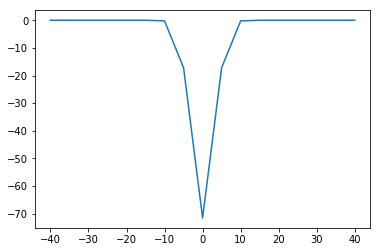

In [30]:
# plot settlement results
fig=plt.figure()

p1 = plt.plot(xs_pts, test_filtered) 

plt.show()

In [31]:
stat_monitor = '205+320'

test_list = settlements_df.loc[[stat_monitor], ['diff_settle']]
test_filtered = array(test_list['diff_settle'].tolist()[1:])  #index=0 was set to zero above
print(test_filtered)

[6.69649584e-33 7.45556842e-25 4.79921597e-18 1.78613890e-12
 3.84325043e-08 4.77780648e-05 3.39166613e-03 1.08647611e-02
 1.08647611e-02 3.39166613e-03 4.77780648e-05 3.84325043e-08
 1.78613890e-12 4.79921597e-18 7.45556842e-25 6.69649584e-33]


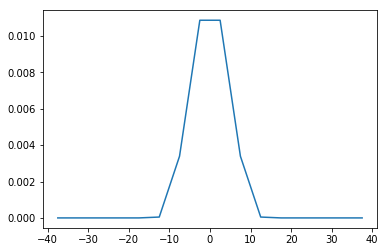

In [32]:
# plot results
fig=plt.figure()
#print('xs_pts: ', xs_pts)
#print('S: ', S*1000)
#p1 = plt.plot(xs_pts, S*1000) 
##p1 = plt.plot(xs_pts, S_stat_monitor*1000) 

xs_pts_plt = xs_pts[1:]
xs_pts_plt = xs_pts_plt -res/2
#print(xs_pts_plt)

#p1 = plt.plot(xs_pts, test_filtered*1000) 
#p1 = plt.plot(xs_pts, test_filtered) 
p1 = plt.plot(xs_pts_plt, test_filtered) 

#plt.xticks(y_pos+width, objects)  # ??
#plt.ylim((0,110))  # ??
##p2 = plt.plot(x_dir, a[2])
##p2 = plt.plot(x_dir, a[3])
##p3 = plt.plot(x_dir, a[4])
##plt.ylabel('Settlement [mm]', **axis_font)
##plt.xlabel('Distance from tunnel axis [m]', **axis_font)
##plt.yticks( **axis_font)
##plt.xticks( **axis_font)
####titleA=('Greenfield-Settlements, Station ' +str(align_data_df['Station'][i]))
##titleA=('Greenfield-Settlements, Station ' +str(a[5]))
##plt.title(titleA, **title_font)
#plt.legend()
plt.show()
#fig.savefig('C:\Users\kzq653\Documents\geopython\settlementtrough_bilder_test' + str(titleA) +'.png', dpi=300)

In [18]:
z_dtm_align = go.Scatter(
    x=align_data_df['StationReal'].tolist(),
    y=align_data_df['DTM'].tolist(),
    name = "Terrain",
    mode='lines',
    line=dict(width=0.5,
              #color='rgb(196, 97, 26)'
             ),
    fill='tozeroy'
)

z_rock_align = go.Scatter(
    x=align_data_df['StationReal'].tolist(),
    y=align_data_df['RockSurface'].tolist(),
    name = "Terrain",
    mode='lines',
    line=dict(width=0.5,
              #color='rgb(196, 97, 26)'
             ),
    fill='tonexty'
)

z_align_line = go.Scatter(
    x=align_data_df['StationReal'].tolist(),
    y=align_data_df['Elevation'].tolist(),
    line=dict(width=3,
              color='rgb(0, 0, 0)'),
    name ="Tunnel"
)

data = [z_dtm_align, z_rock_align, z_align_line]

layout = go.Layout(
    title='Longitudinal Section',
    showlegend=True,
    xaxis=dict(
        title= "Stationing",
    ),
    yaxis=dict(
        title = "m a.s.l.",
        range = [180,300]
    )
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='stacked-area-plot')